# Przetwarzanie wstępne. Filtracja kontekstowa.


### Cel:
- zapoznanie z pojęciem kontekstu / filtracji kontekstowej,
- zapoznanie z pojęciem konwolucji (splotu),
- zapoznanie z wybranymi filtrami:
	- filtry liniowe dolnoprzepustowe:
		- filtr uśredniający,
		- filtr Gaussa.
	- filtry nielinowe:
		- mediana,
		- mediana dla obrazów kolorowych.
	- filtry liniowe górnoprzepustowe:
			- laplasjan,
			- operator Robersta, Prewitta, Sobela.
- zadanie domowe: adaptacyjna filtracja medianowa.

### Filtry liniowe uśredniające (dolnoprzepustowe)

Jest to podstawowa rodzina filtrów stosowana w cyfrowym przetwarzaniu obrazów.
Wykorzystuje się je w celu "rozmazania" obrazu i tym samym redukcji szumów (zakłóceń) na obrazie.
Filtr określony jest przez dwa parametry: rozmiar maski (ang. _kernel_) oraz wartości współczynników maski.

Warto zwrócić uwagę, że omawiane w niniejszym rozdziale operacje generują nową wartość piksela na podstawie pewnego fragmentu obrazu (tj. kontekstu), a nie jak operacje punktowe tylko na podstawie jednego piksela.


1. Wczytaj obraz _plansza.png_.
W dalszej części ćwiczenia sprawdzenie działania filtracji dla innych obrazów sprowadzi się do wczytania innego pliku.

2. Podstawowa funkcja to `cv2.filter2D`  - realizacja filtracji konwolucyjnej.
   Proszę sprawdzić jej dokumentację i zwrócić uwagę na obsługę problemu brzegowego (na krawędziach istnieją piksele dla których nie da się wyznaczyć otoczenia).

  Uwaga. Problem ten można też rozwiązać z użyciem funkcji `signal.convolve2d` z biblioteki _scipy_ (`from scipy import signal`).

3. Stwórz podstawowy filtr uśredniający o rozmiarze $3 \times 3$ -- za pomocą funkcji `np.ones`. Wykonaj konwolucję na wczytanym obrazie. Na wspólnym rysunku wyświetl obraz oryginalny, po filtracji oraz moduł z różnicy.

4. Przeanalizuj otrzymane wyniki. Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?

In [ ]:
import cv2
import os
import requests
from matplotlib import pyplot as plt
import numpy as np
from scipy import signal
from mpl_toolkits.mplot3d import Axes3D



url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/'

fileNames = ["jet.png", "kw.png", "moon.png", "lenaSzum.png", "lena.png", "plansza.png"]
for fileName in fileNames:
  if not os.path.exists(fileName):
      r = requests.get(url + fileName, allow_redirects=True)
      open(fileName, 'wb').write(r.content)



5. Na wspólnym rysunku wyświetl wyniki filtracji uśredniającej z oknem o rozmiarze 3, 5, 9, 15 i 35.
Wykorzystaj polecenie `plt.subplot`.
Przeanalizuj wpływ rozmiaru maski na wynik.

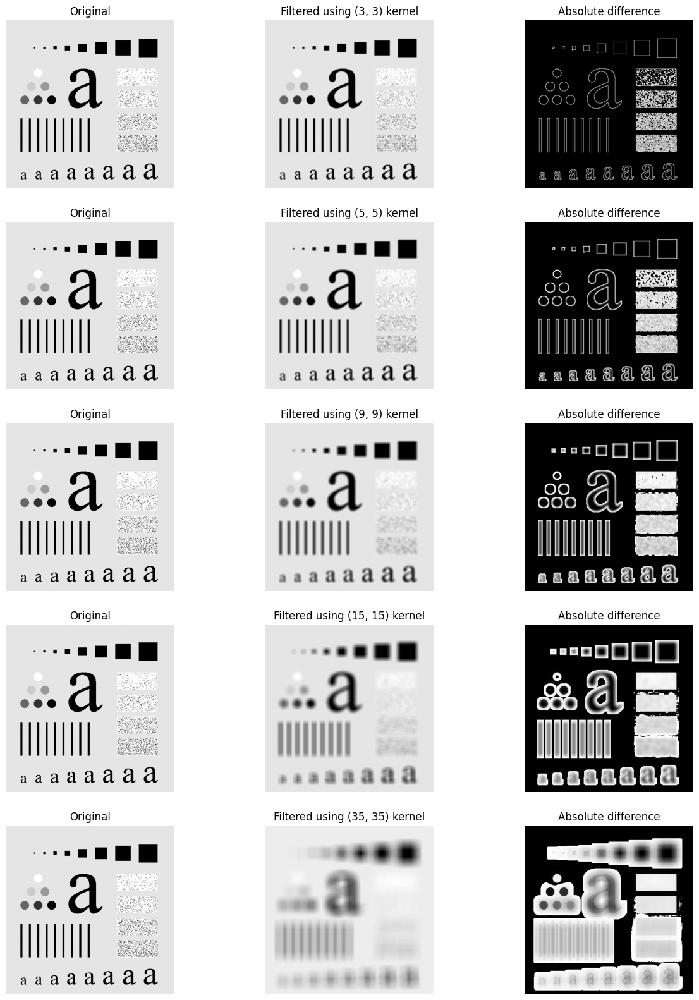

In [ ]:
def aximshow(ax, img, title="", **kwargs):
  ax.imshow(img, cmap='gray', **kwargs)
  ax.set_title(title)
  ax.axis('off')


def test_avg_kernel(img):
  fig, axs = plt.subplots(5, 3, figsize=(15, 20))
  for i, k in enumerate([3,5,9,15,35]):
    kernel = np.ones((k,k)) / k**2
    test_kernel(img, kernel, axs[i, :])


def show_results(original, filtered, axs, kernel_desc="kernel"):
  aximshow(axs[0], original, title="Original")
  aximshow(axs[1], filtered, title=f"Filtered using {kernel_desc}")
  aximshow(axs[2], np.abs(filtered - original), title="Absolute difference")


def test_kernel(img, kernel, axs, kernel_name="kernel"):
  filtered = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REPLICATE)

  show_results(img, filtered, axs, f"{kernel.shape} {kernel_name}")



board = cv2.imread('plansza.png', cv2.IMREAD_GRAYSCALE)
test_avg_kernel(board)

6. Wczytaj obraz _lena.png_.
Zaobserwuj efekty filtracji dolnoprzepustowej dla obrazu rzeczywistego.

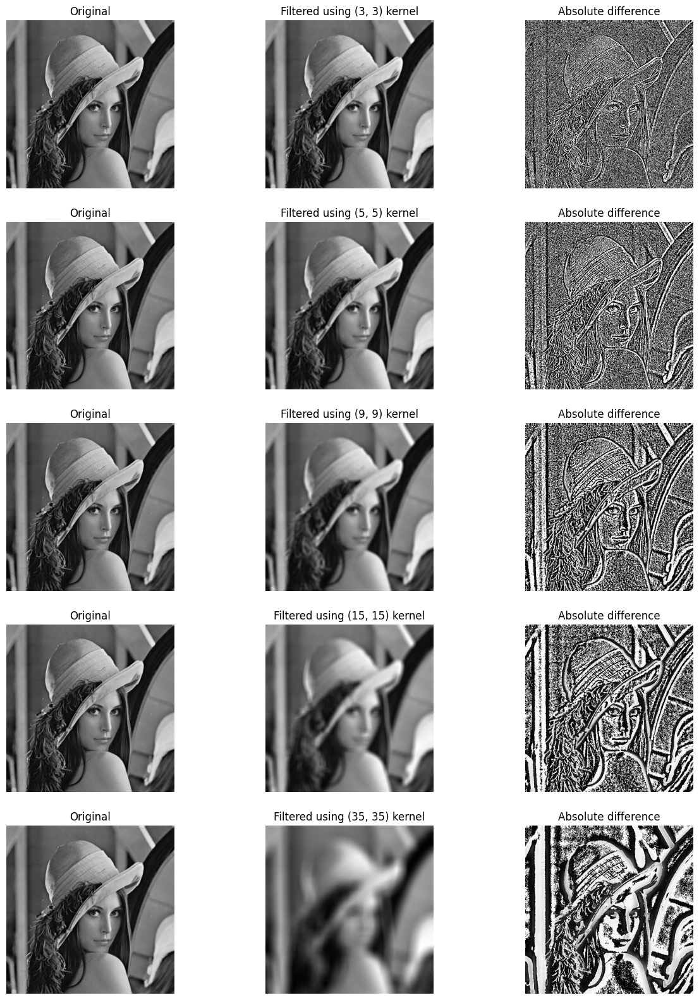

In [ ]:
lena = cv2.imread('lena.png', cv2.IMREAD_GRAYSCALE)
test_avg_kernel(lena)

7. Niekorzystny efekt towarzyszący wykonanym filtracjom dolnoprzepustowym to utrata ostrości.
Częściowo można go zniwelować poprzez odpowiedni dobór maski.
Wykorzystaj maskę:  `M = np.array([1 2 1; 2 4 2; 1 2 1])`.
Przed obliczeniami należy jeszcze wykonać normalizację - podzielić każdy element maski przez sumę wszystkich elementów: `M = M/sum(sum(M));`.
Tak przygotowaną maskę wykorzystaj w konwolucji - wyświetl wyniki tak jak wcześniej.
Możliwe jest też wykorzystywanie innych masek - współczynniki można dopasowywać do konkretnego problemu.

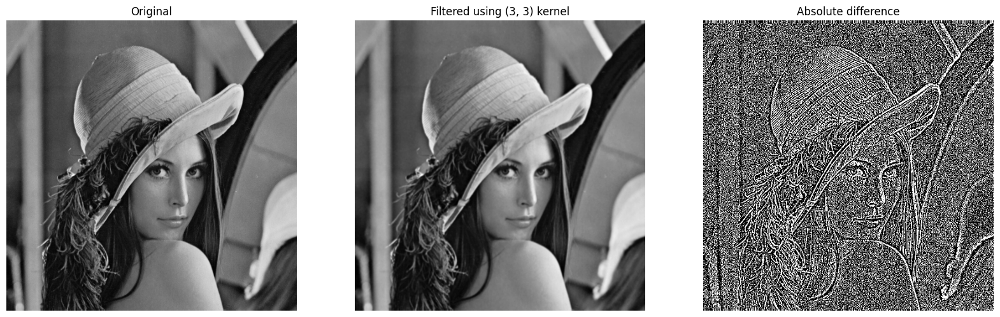

In [ ]:
kernel = np.array([[1,2,1],[2,4,2],[1,2,1]])
kernel = kernel / kernel.sum()

fig, axs = plt.subplots(1,3, figsize=(20,20))
test_kernel(lena, kernel, axs)

8. Skuteczną i często wykorzystywaną maską jest tzw. maska Gasussa.
Jest to zbiór liczb, które aproksymują dwuwymiarowy rozkład Gaussa.
Parametrem jest odchylenie standardowe i rozmiar maski.

9. Wykorzystując przygotowaną funkcję `fgaussian` stwórz maskę o rozmiarze $5 \times 5$ i odchyleniu standardowym 0.5.
  Wykorzystując funkcję `mesh` zwizualizuj filtr.
  Sprawdź jak parametr ``odchylenie standardowe'' wpływa na ``kształt'' filtru.

  Uwaga. W OpenCV dostępna jest *dedykowana* funkcja do filtracji Gaussa - `GaussianBlur`.
  Proszę na jednym przykładzie porównać jej działanie z użytym wyżej rozwiązaniem.

10. Wykonaj filtrację dla wybranych (2--3) wartości odchylenia standardowego.


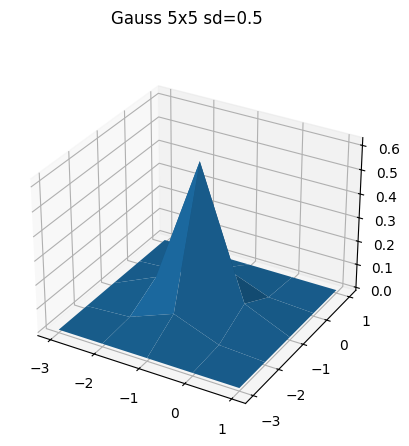

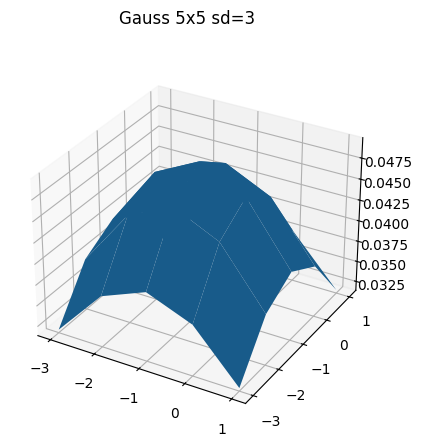

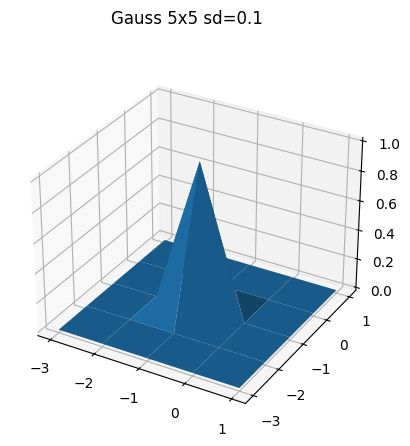

In [ ]:
def fgaussian(size, sigma):
     m = n = size
     h, k = m//2, n//2
     x, y = np.mgrid[-h:h+1, -k:k+1]
     g = np.exp(-(x**2 + y**2)/(2*sigma**2))
     return g /g.sum()


def mesh(fun, size, title=""):
    fig = plt.figure()
    fig.suptitle(title)
    ax = fig.add_subplot(111,projection='3d')


    X = np.arange(-size//2, size//2, 1)
    Y = np.arange(-size//2, size//2, 1)
    X, Y = np.meshgrid(X, Y)
    Z = fun

    ax.plot_surface(X, Y, Z)

    plt.show()

# mesh(fgaussian(25, 3), 25, )
mesh(fgaussian(5, 0.5), 5, title="Gauss 5x5 sd=0.5")
mesh(fgaussian(5, 3), 5, title="Gauss 5x5 sd=3")
mesh(fgaussian(5, 0.1), 5, title="Gauss 5x5 sd=0.1")


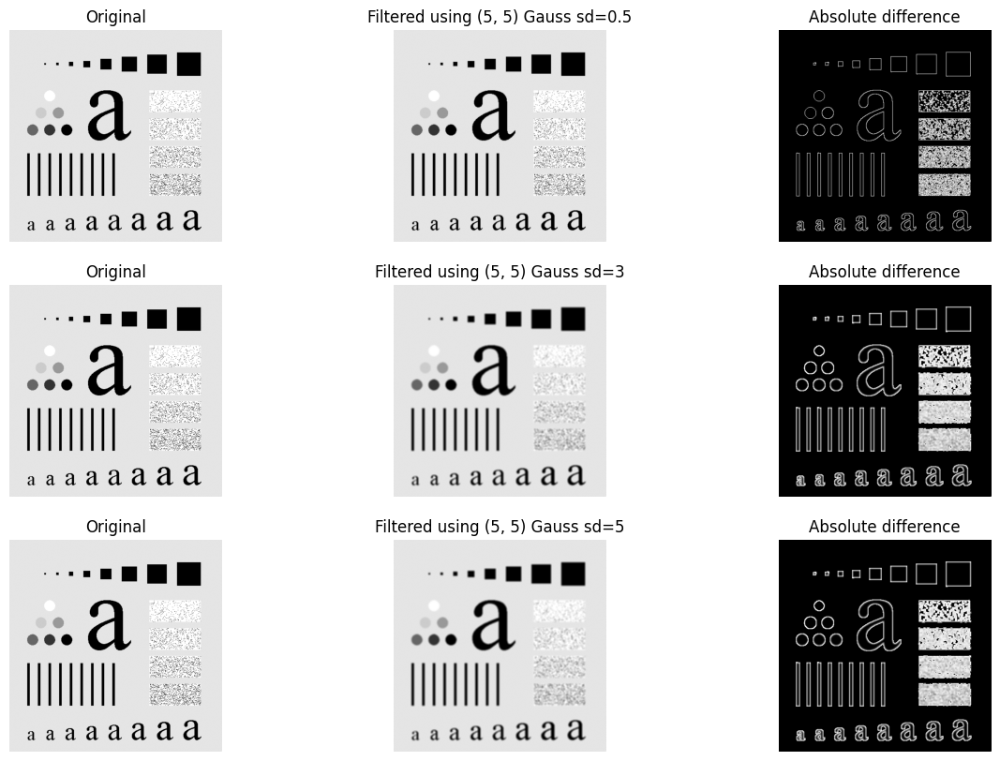

In [ ]:
fig, axs = plt.subplots(3, 3, figsize=(15,10))
for sd, axs_row in zip([0.5, 3, 5], axs):
  test_kernel(board, fgaussian(5, sd), axs_row, f"Gauss sd={sd}")
fig.show()


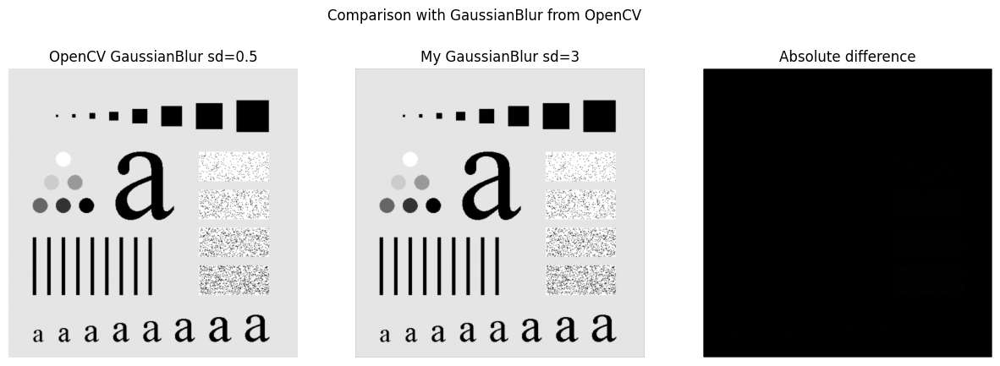

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(15,5))
fig.suptitle("Comparison with GaussianBlur from OpenCV")
cv_blurred = cv2.GaussianBlur(board, (5,5), 0.5)
my_blurred = signal.convolve2d(board, fgaussian(5, 0.5), mode='same')
for ax in axs: ax.axis('off')
axs[0].imshow(cv_blurred, cmap='gray')
axs[0].set_title("OpenCV GaussianBlur sd=0.5")
axs[1].imshow(my_blurred, cmap='gray')
axs[1].set_title("My GaussianBlur sd=3")
axs[2].imshow(np.abs(cv_blurred - my_blurred), cmap='gray')
axs[2].set_title("Absolute difference")
fig.show()

### Filtry nieliniowe -- mediana

Filtry rozmywające redukują szum, ale niekorzystnie wpływają na ostrość obrazu.
Dlatego często wykorzystuje się filtry nieliniowe - np. filtr medianowy (dla przypomnienia: mediana - środkowa wartość w posortowanym ciągu liczb).

Podstawowa różnica pomiędzy filtrami liniowymi, a nieliniowymi polega na tym, że przy filtracji liniowej na nową wartość piksela ma wpływ wartość wszystkich pikseli z otoczenia (np. uśrednianie, czasem ważone), natomiast w przypadku filtracji nieliniowej jako nowy piksel wybierana jest któraś z wartości otoczenia - według jakiegoś wskaźnika (wartość największa, najmniejsza czy właśnie mediana).


1. Wczytaj obraz _lenaSzum.png_ (losowe 10% pikseli białych lub czarnych - tzw. zakłócenia impulsowe). Przeprowadź filtrację uśredniającą z rozmiarem maski 3x3. Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Wykorzystując funkcję ``cv2.medianBlur` wykonaj filtrację medianową _lenaSzum.png_ (z rozmiarem maski $3 \times 3$). Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Która filtracja lepiej radzi sobie z tego typu szumem?

  Uwaga. Taki sam efekt da również użycie funkcji `signal.medfilt2d`.


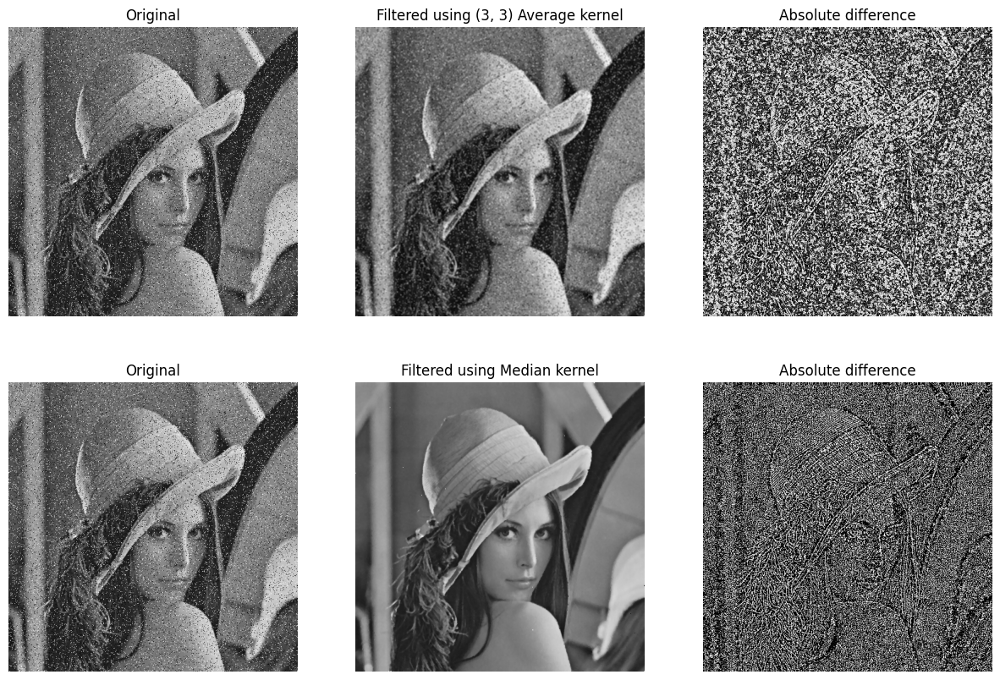

In [ ]:
lena_blurred = cv2.imread('lenaSzum.png', cv2.IMREAD_GRAYSCALE)
fig, axs = plt.subplots(2, 3, figsize=(15,10))
test_kernel(lena_blurred, np.ones((3,3))/9, axs[0, :], "Average kernel")
show_results(lena_blurred, cv2.medianBlur(lena_blurred, 3), axs[1, :], "Median kernel")

2. Przeprowadź filtrację uśredniającą, a następnie medianową obrazu _lena.png_.
   Wyniki porównaj - dla obu wyświetl: oryginał, wynik filtracji i moduł z różnicy.
   Szczególną uwagę zwróć na ostrość i krawędzie.
   W której filtracji krawędzie zostają lepiej zachowane?

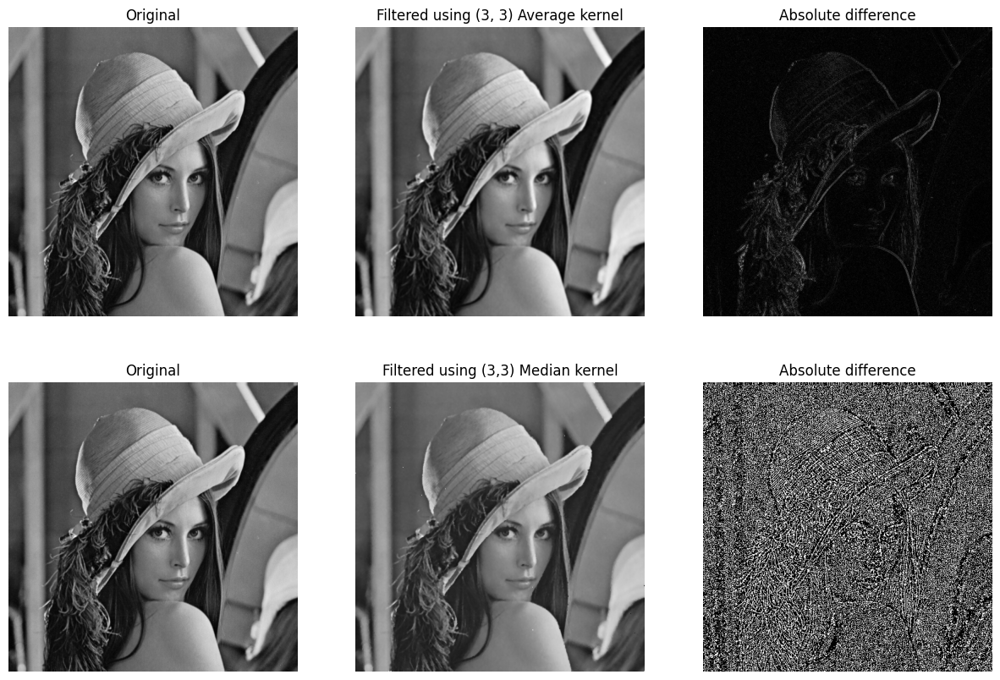

In [ ]:
fig, axs = plt.subplots(2, 3, figsize=(15,10))
test_kernel(lena, np.ones((3,3))/9, axs[0, :], "Average kernel")
show_results(lena, cv2.medianBlur(lena_blurred, 3), axs[1, :], "(3,3) Median kernel")

3. Ciekawy efekt można uzyskać wykonując filtrację medianową wielokrotnie. Określa się go mianem  posteryzacji.  W wyniku przetwarzania z obrazka usunięte zostają detale, a duże obszary uzyskują tą samą wartość jasności.  Wykonaj operację mediany $5 \times 5$ na obrazie _lena.png_ 10-krotnie. (wykorzystaj np. pętlę `for`).


Inne filtry nieliniowe:
- filtr modowy - moda (dominanta) zamiast mediany,
- filtr olimpijski - średnia z podzbioru otoczenia (bez wartości ekstremalnych),
- hybrydowy filtr medianowy - mediana obliczana osobno w różnych podzbiorach otoczenia (np. kształt ``x'',``+''), a jako wynik brana jest mediana ze zbioru wartość elementu centralnego, mediana z ``x'' i mediana z ``+'',
- filtr minimalny i maksymalny (będą omówione przy okazji operacji morfologicznych w dalszej części kursu).


Warto zdawać sobie sprawę, z szerokich możliwości dopasowywania rodzaju filtracji do konkretnego rozważanego problemu i rodzaju zaszumienia występującego na obrazie.

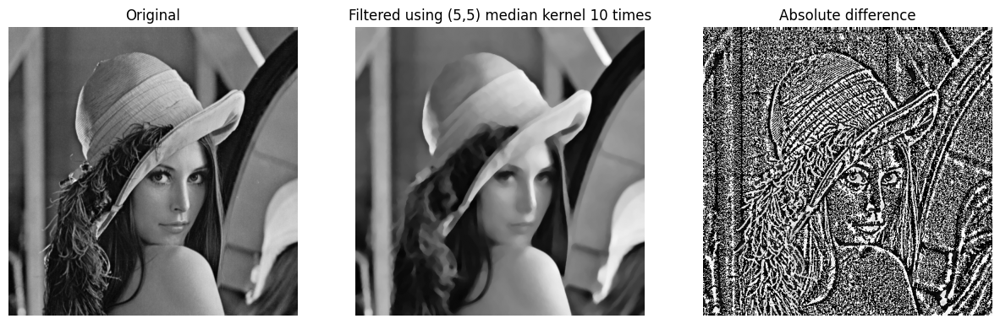

In [ ]:
lena_posterized = cv2.imread('lena.png', cv2.IMREAD_GRAYSCALE)
for i in range(10):
  lena_posterized = cv2.medianBlur(lena_posterized, 5)
fig, axs = plt.subplots(1, 3, figsize=(15,5))
show_results(lena, lena_posterized, axs, "(5,5) median kernel 10 times")

## Filtry liniowe górnoprzepustowe (wyostrzające, wykrywające krawędzie)

Zadaniem filtrów górnoprzepustowych jest wydobywanie z obrazu składników odpowiedzialnych za szybkie zmiany jasności - konturów, krawędzi, drobnych elementów tekstury.

### Laplasjan (wykorzystanie drugiej pochodnej obrazu)

1. Wczytaj obraz _moon.png_.

2. Wprowadź podstawową maskę laplasjanu:
\begin{equation}
M =
\begin{bmatrix}
0 & 1& 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0
\end{bmatrix}
\end{equation}

3. Przed rozpoczęciem obliczeń należy dokonać normalizacji maski - dla rozmiaru $3 \times 3$ podzielić każdy element przez 9.
   Proszę zwrócić uwagę, że nie można tu zastosować takiej samej normalizacji, jak dla filtrów dolnoprzepustowanych, gdyż skutkowałby to dzieleniem przez 0.

4. Wykonaj konwolucję obrazu z maską (`c2.filter2D`). Przed wyświetleniem, wynikowy obraz należy poddać normalizacji (występują ujemne wartości). Najczęściej wykonuje się jedną z dwóch operacji:
- skalowanie (np. poprzez dodatnie 128 do każdego z pikseli),
- moduł (wartość bezwzględna).

Wykonaj obie normalizacje.
Na wspólnym wykresie wyświetl obraz oryginalny oraz przefiltrowany po obu normalizacjach.

0 9


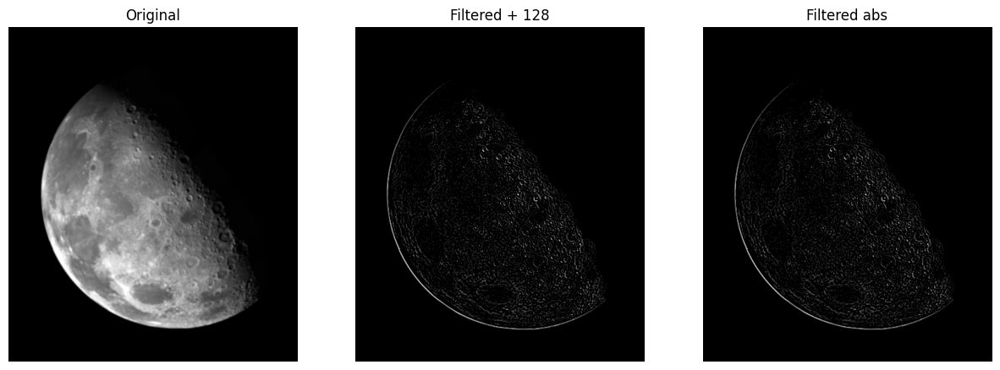

In [ ]:
moon = cv2.imread('moon.png', cv2.IMREAD_GRAYSCALE)
M = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]]) / 9
filtered = cv2.filter2D(moon, -1, M)
print(np.min(filtered), np.max(filtered))
filtered_scaled = filtered + 128
filtered_abs = np.abs(filtered)

fig, axs = plt.subplots(1, 3, figsize=(15, 15))
for ax in axs: ax.axis('off')
aximshow(axs[0], moon, title="Original")
aximshow(axs[1], filtered_scaled, title="Filtered + 128")
aximshow(axs[2], filtered_abs, title="Filtered abs")

7. Efekt wyostrzenia uzyskuje się po odjęciu/dodaniu (zależy do maski) rezultatu filtracji laplasjanowej i oryginalnego obrazu. Wyświetl na jednym wykresie: obraz oryginalny, sumę oryginału i wyniku filtracji oraz różnicę (bezwzględną) oryginału i wyniku filtracji.
 Uwaga. Aby uniknąć artefaktów, należy obraz wejściowy przekonwertować do formatu ze znakiem.



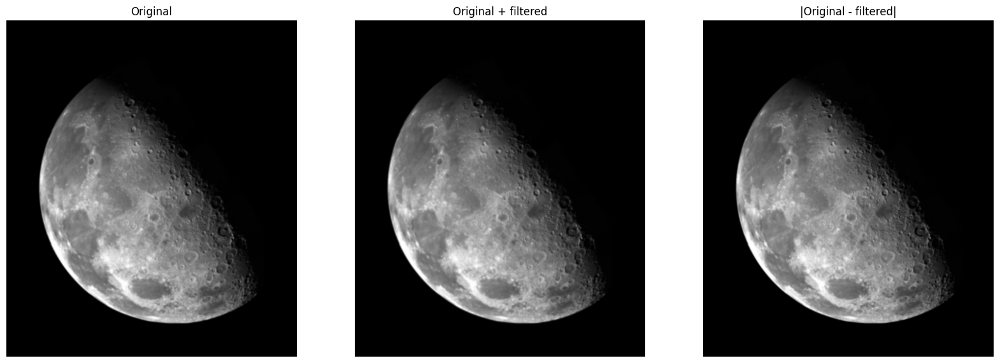

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(20, 10))
for ax in axs: ax.axis('off')
aximshow(axs[0], moon, title="Original")
aximshow(axs[1], moon.astype('int32') + filtered_abs, title="Original + filtered")
aximshow(axs[2], np.abs(moon.astype('int32') - filtered_abs), title="|Original - filtered|")

### Gradienty (wykorzystanie pierwszej pochodnej obrazu)

1. Wczytaj obraz _kw.png_. Stwórz odpowiednie maski opisane w kolejnych punktach i dokonaj filtracji.
2. Wykorzystując gradient Robertsa przeprowadź detekcję krawędzi - poprzez wykonanie konwolucji obrazu z daną maską:
\begin{equation}
R1 = \begin{bmatrix} 0 & 0 & 0 \\ -1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix}   
R2 = \begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & -1 \\ 0 & 1 & 0 \end{bmatrix}
\end{equation}

Wykorzystaj stworzony wcześniej kod (przy laplasjanie) - dwie metody normalizacji oraz sposób wyświetlania.

3. Analogicznie przeprowadź detekcję krawędzi za pomocą gradientu Prewitta (pionowy i poziomy)
\begin{equation}
P1 = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}   
P2 = \begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}
\end{equation}

4. Podobnie skonstruowany jest gradient Sobela (występuje osiem masek, zaprezentowane są dwie ``prostopadłe''):
\begin{equation}
S1 = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}   
S2 = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}
\end{equation}

Przeprowadź detekcję krawędzi za pomocą gradientu Sobela.

In [ ]:
kw = cv2.imread('kw.png', cv2.IMREAD_GRAYSCALE)
R1 = np.array([[0, 0, 0], [-1, 0, 0], [0, 1, 0]])
R2 = np.array([[0, 0, 0], [0, 0, -1], [0, 1, 0]])
P1 = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
P2 = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])
S1 = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
S2 = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

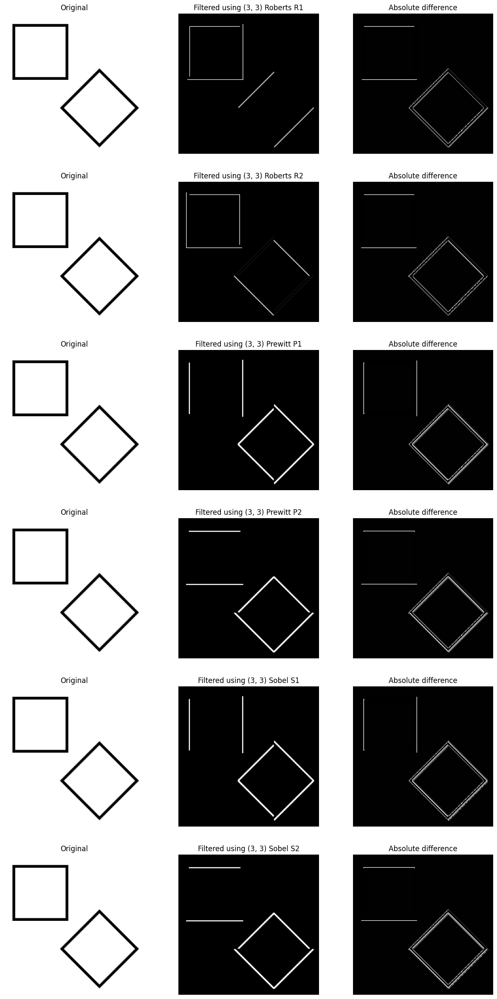

In [ ]:
fig, axs = plt.subplots(6, 3, figsize=(15, 30))
for i, (kernel, name) in enumerate([
    (R1, "Roberts R1"),
    (R2, "Roberts R2"),
    (P1, "Prewitt P1"),
    (P2, "Prewitt P2"),
    (S1, "Sobel S1"),
    (S2, "Sobel S2"),
]):
  test_kernel(kw, kernel, axs[i, :], name)

5. Na podstawie dwóch ortogonalnych masek np. Sobela można stworzyć tzw. filtr kombinowany - pierwiastek kwadratowy z sumy kwadratów gradientów:
\begin{equation}
OW = \sqrt{(O * S1)^2 + (O * S2)^2}
\end{equation}
gdzie:  $OW$ - obraz wyjściowy, $O$ - obraz oryginalny (wejściowy), $S1,S2$ - maski Sobela, $*$ - operacja konwolucji.

Zaimplementuj filtr kombinowany.

Uwaga. Proszę zwrócić uwagę na konieczność zmiany formatu danych obrazu wejściowego - na typ znakiem



In [ ]:
def combine_sobel(img):
  img_s1 = cv2.filter2D(img, -1, S1).astype('int')
  img_s2 = cv2.filter2D(img, -1, S2).astype('int')
  return np.sqrt(np.square(img_s1) + np.square(img_s2)).astype('uint8')

6. Istnieje alternatywna wersja filtra kombinowanego, która zamiast pierwiastka z sumy kwadratów wykorzystuje sumę modułów (prostsze obliczenia).
Zaimplementuj tę wersję.

In [ ]:
def combine_sobel_abs(img):
  img_s1 = cv2.filter2D(img, -1, S1).astype('int')
  img_s2 = cv2.filter2D(img, -1, S2).astype('int')
  return np.abs(img_s1) + np.abs(img_s2)

7. Wczytaj plik _jet.png_ (zamiast _kw.png_).
Sprawdź działanie obu wariantów filtracji kombinowanej.

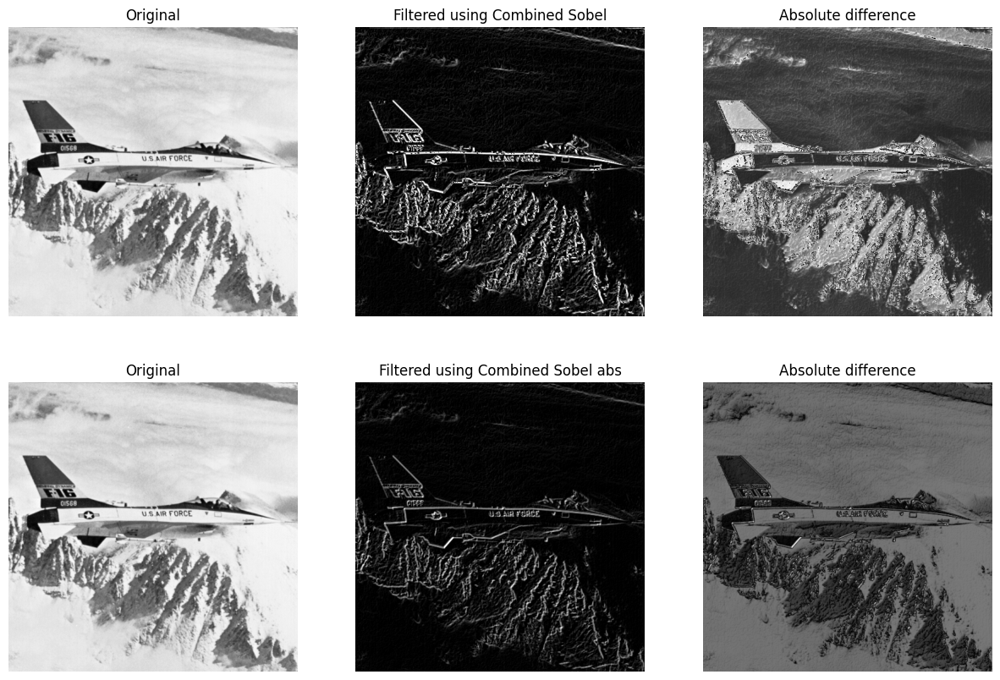

In [ ]:
jet = cv2.imread('jet.png', cv2.IMREAD_GRAYSCALE)
fig, axs = plt.subplots(2, 3, figsize=(15, 10))
show_results(jet, combine_sobel(jet), axs[0, :], "Combined Sobel")
show_results(jet, combine_sobel_abs(jet), axs[1, :], "Combined Sobel abs")
